### Todo
- [ ] VAE parameter tweaking
- [ ] VAE training

# Data stuff

## Essentials

In [1]:
import torch as pt
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from io import BytesIO

/home/iantitor/Documents/projects/professional/bsci3961-project/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using image path: frieren.png
Original Image Size: <built-in method size of Tensor object at 0x7fbc73831d60> (Width, Height)
PyTorch Tensor Shape (C, H, W): torch.Size([3, 1858, 1920])
PyTorch Tensor Data Type: torch.float32


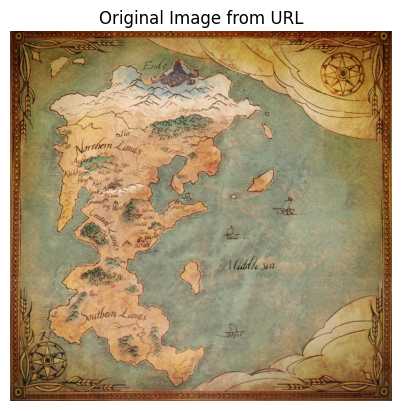

In [3]:
image_path = 'frieren.png'
print(f"Using image path: {image_path}")

img = transforms.ToTensor()(Image.open(image_path))

print(f"Original Image Size: {img.size} (Width, Height)")
print(f"PyTorch Tensor Shape (C, H, W): {img.shape}")
print(f"PyTorch Tensor Data Type: {img.dtype}")

plt.imshow(img.permute(1, 2, 0))
plt.title('Original Image from URL')
plt.axis('off')
plt.show()



In [ ]:
class Patcher:
  def __init__(self, image, patch_size, patch_stride):
    self.image = image
    self.patch_size = patch_size
    self.patch_stride = patch_stride

    self.grid = img.unfold(1, patch_size, patch_stride).unfold(2, patch_size, patch_stride).permute(1, 2, 0, 3, 4)
    self.shape = self.grid.shape[:2]

  def __call__(self, coords):
    patches = self.grid[*coords.T]

    return patches

In [ ]:
dumb_rng = lambda i, c, seed, x_min, x_max: (i ** c + seed) % (x_max - x_min) + x_min

def get_raw_path(i, num_points=128, c=51, seed=6, x_min=-5, x_max=5):
  # c and seed are genuinely divine numbers, beware when adjusting
  i = pt.arange(num_points * 2).view(-1, 2) + num_points * 2 * i

  dx = dumb_rng(i, c, seed, x_min, x_max)
  return pt.cat((pt.tensor([[0, 0]]), dx.cumsum(dim=0)))

def get_path(i, img_size, min_size, num_points=128, c=51, seed=6, x_min=-5, x_max=5):
  img_size = pt.tensor(img_size)
  raw_path = get_raw_path(i, num_points, c, seed, x_min, x_max)

  raw_min = raw_path.min(dim=0).values
  raw_max = raw_path.max(dim=0).values
  raw_range = raw_max - raw_min

  min_max = ((img_size - min_size) / 2).int()
  max_min = ((img_size + min_size) / 2).int()

  min_i, max_i = (pt.arange(4) + 4 * i).view(2, 2)
  path_min = dumb_rng(min_i, c, seed, 0, min_max)
  path_max = dumb_rng(max_i, c, seed, max_min, img_size)
  path_range = path_max - path_min
  print(img_size)
  print(path_max)

  path = (raw_path - raw_min) / raw_range * path_range + path_min
  return path.int()



In [ ]:
class PathDataset(Dataset):
  def __init__(self, image, num_samples, num_points, patch_size=64, patch_stride=1, move_max=5):
    self.patcher = Patcher(image, patch_size, patch_stride)
    self.num_samples = num_samples
    self.num_points = num_points
    self.move_max = move_max

  def __len__(self):
    return self.num_samples

  def __getitem__(self, idx):
    coords = get_path(idx, self.patcher.shape, self.num_points, x_min=-self.move_max, x_max=self.move_max)
    moves = coords.diff(dim=0)

    patches = self.patcher(coords)
    in_patches = patches[:-1]
    out_patches = patches[1:]

    return moves, in_patches, out_patches

class PatchDataset(Dataset):
  def __init__(self, image, patch_size=64, patch_stride=1):
    self.patcher = Patcher(image, patch_size, patch_stride)
    self.n_h, self.n_w = self.patcher.shape

  def __len__(self):
        return self.n_h * self.n_w

  def __getitem__(self, idx):
        y = idx // self.n_w
        x = idx % self.n_w
        patch = self.patcher(pt.tensor([[y, x]]))[0]
        return patch

## Testing

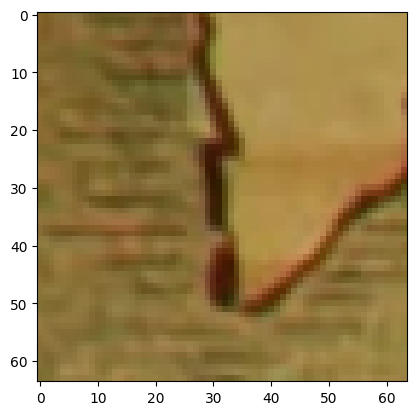

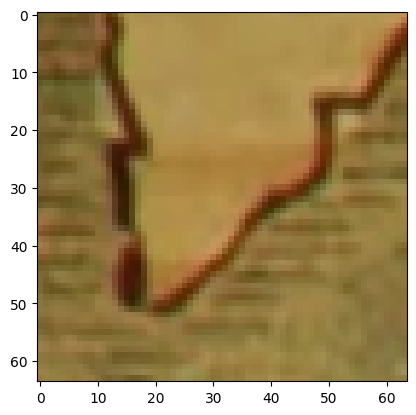

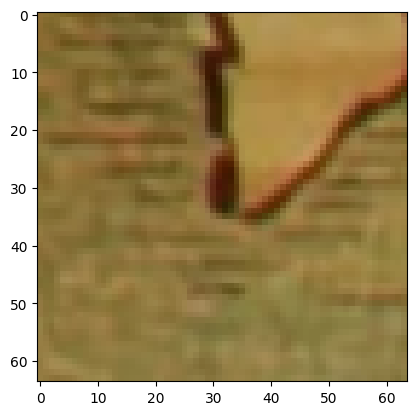

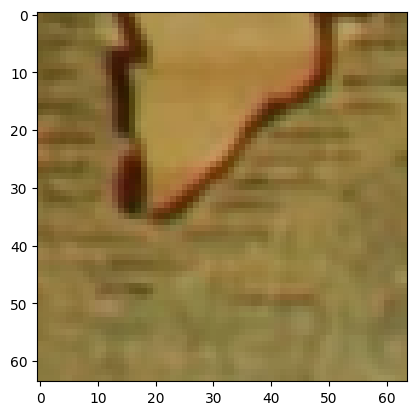

In [ ]:
patcher = Patcher(img, 64, 16)
ps = patcher(pt.tensor([[0, 0], [0, 1], [1, 0], [1, 1]]) + 8)

for p in ps:
  plt.imshow(p.permute(1, 2, 0))
  plt.show()

In [ ]:
i = 34

34
tensor([1430, 1478])
tensor([1082, 1461])


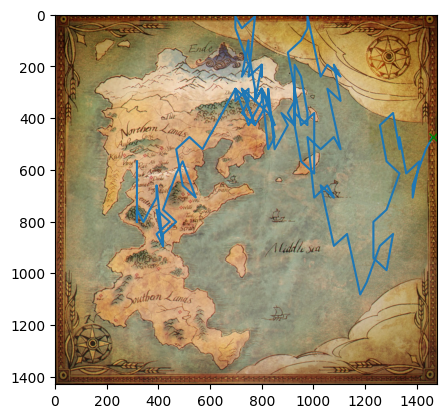

In [ ]:
print(i)
x = get_path(i, img.shape[1:], 128)
#i += 1

plt.imshow(img.permute(1, 2, 0))
plt.plot(x[:, 1], x[:, 0])
plt.plot(x[0, 1], x[0, 0], 'gx')
plt.show()

In [ ]:
a = PatchDataset(img)
print("dataset length:", len(a))


dataset length: 1934305


In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML

exds = PathDataset(img, 100, 128, 64, 1)
print(f"Patcher shape: {exds.patcher.shape}")

def create_animation_for_sample(dataset, sample_idx):
  moves, in_patches, out_patches = dataset[sample_idx]

  # Use subplot_mosaic for a more flexible layout
  fig, axes = plt.subplot_mosaic([['input', 'arrow'], ['output', 'arrow']], figsize=(10, 8))
  plt.close(fig) # Prevent initial static plot from showing

  ax1 = axes['input']
  ax2 = axes['arrow']
  ax3 = axes['output']

  # Initial plots
  im1 = ax1.imshow(in_patches[0].permute(1, 2, 0).numpy())
  ax1.set_title('Input Patch')
  ax1.axis('off')

  # Arrow plot setup
  # Calculate max absolute movement for axis limits
  max_move_val = moves.abs().max().item() + 1 # Add a small margin
  ax2.set_xlim(-max_move_val, max_move_val)
  ax2.set_ylim(-max_move_val, max_move_val)
  ax2.set_aspect('equal', adjustable='box')
  ax2.set_title('Movement (dx, dy)')
  ax2.grid(True)
  # Store arrow_obj in a list so it can be modified in place by animate via closure
  current_arrow_list = [ax2.arrow(0, 0, moves[0, 1].item(), moves[0, 0].item(), head_width=0.5, head_length=0.7, fc='blue', ec='blue')] # dx is moves[:,1], dy is moves[:,0]

  im3 = ax3.imshow(out_patches[0].permute(1, 2, 0).numpy())
  ax3.set_title('Output Patch')
  ax3.axis('off')

  def animate(i):
    im1.set_data(in_patches[i].permute(1, 2, 0).numpy())

    # Update arrow
    current_arrow_list[0].remove() # Remove the previous arrow
    current_arrow_list[0] = ax2.arrow(0, 0, moves[i, 1].item(), moves[i, 0].item(), head_width=0.5, head_length=0.7, fc='blue', ec='blue') # Create and store new arrow

    im3.set_data(out_patches[i].permute(1, 2, 0).numpy())
    return im1, current_arrow_list[0], im3

  num_frames = len(moves)
  anim = animation.FuncAnimation(fig, animate, frames=num_frames, interval=1000, blit=False)
  return anim

# Example usage:
print("Generating animation for sample 0...")
anim = create_animation_for_sample(exds, 0)
HTML(anim.to_jshtml())

Patcher shape: torch.Size([1367, 1415])
Generating animation for sample 0...


# Model Stuff

## VAE

In [ ]:
class VAE(nn.Module):
    def __init__(self, conv_channels, linear_features, input_channels=3):
        super().__init__()

        # --- Encoder ---
        self.enc_convs = nn.ModuleList()
        in_c = input_channels

        # Build Conv Layers
        for out_c in conv_channels:
            self.enc_convs.append(
                nn.Conv2d(in_c, out_c, kernel_size=3, stride=2, padding=1)
            )
            in_c = out_c

        # Build Linear Layers (FC)
        self.enc_linears = nn.ModuleList()
        # Input to first linear is the last conv channel count (due to Global Mean)
        in_f = conv_channels[-1]

        # All linears except the last one (which splits into mu/var)
        for out_f in linear_features[:-1]:
            self.enc_linears.append(nn.Linear(in_f, out_f))
            in_f = out_f

        # Final layers for Mu and LogVar
        latent_dim = linear_features[-1]
        self.fc_mu = nn.Linear(in_f, latent_dim)
        self.fc_logvar = nn.Linear(in_f, latent_dim)

        # --- Decoder ---
        # Mirroring Encoder Linears
        self.dec_linears = nn.ModuleList()
        # Start from latent dim
        in_f = latent_dim

        # Reverse features (excluding latent), ending at conv_channels[-1]
        rev_features = linear_features[:-1][::-1] + [conv_channels[-1]]

        for out_f in rev_features:
            self.dec_linears.append(nn.Linear(in_f, out_f))
            in_f = out_f

        # Mirroring Encoder Convs
        self.dec_convs = nn.ModuleList()
        # Start from last conv channel
        in_c = conv_channels[-1]

        # Reverse conv channels, ending at input_channels (3)
        rev_channels = conv_channels[:-1][::-1] + [input_channels]

        for i, out_c in enumerate(rev_channels):
            # Last layer usually doesn't need bias if followed by Sigmoid, but keeping standard
            is_last = (i == len(rev_channels) - 1)
            self.dec_convs.append(
                nn.ConvTranspose2d(
                    in_c, out_c,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                    output_padding=1 # Ensures exactly 2x upsampling
                )
            )
            in_c = out_c

    def encode(self, x):
        # 1. Convolutions
        for conv in self.enc_convs:
            x = F.relu(conv(x))

        # 2. Global Mean Pooling (No Flattening)
        # Shape: (Batch, Channels, H, W) -> (Batch, Channels)
        x = x.mean(dim=[2, 3])

        # 3. Linear Layers
        for linear in self.enc_linears:
            x = F.relu(linear(x))

        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = pt.exp(0.5 * logvar)
        eps = pt.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        # 1. Linear Layers
        x = z
        for linear in self.dec_linears:
            x = F.relu(linear(x))

        # 2. Reshape for Convs (Inverse of Global Mean)
        # We project to (Batch, C) then view as (Batch, C, 1, 1)
        x = x.view(x.size(0), x.size(1), 1, 1)

        # 3. Transposed Convolutions
        for i, deconv in enumerate(self.dec_convs):
            x = deconv(x)
            if i != len(self.dec_convs) - 1:
                x = F.relu(x)
            else:
                x = pt.sigmoid(x) # Final activation
        return x

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon_x = self.decode(z)
        return recon_x, mu, logvar

    def vae_loss(self, recon_x, x, mu, logvar):
        # Note: If dimensions mismatch due to GAP (1x1 -> upsampling),
        # you might need to interpolate recon_x or x.
        # Standard BCE requires matching shapes.
        if recon_x.shape != x.shape:
             recon_x = F.interpolate(recon_x, size=x.shape[2:], mode='bilinear', align_corners=False)

        BCE = F.binary_cross_entropy(recon_x, x, reduction='sum')
        KLD = -0.5 * pt.sum(1 + logvar - mu.pow(2) - logvar.exp())
        return BCE + KLD

# Usage Example
# convs = [32, 64, 128, 256] -> 4 layers
# feats = [128, 64] -> Latent dim is 64


In [ ]:
model = VAE(conv_channels=[32, 64, 128, 256], linear_features=[128, 64])

# Dummy input
x = pt.randn(2, 3, 64, 64)
recon, mu, logvar = model(x)
print(f"Input: {x.shape}, Output: {recon.shape}")

Input: torch.Size([2, 3, 64, 64]), Output: torch.Size([2, 3, 16, 16])


In [ ]:
# Hyperparameters
num_epochs = 100
learning_rate = 1e-3
batch_size = 164
conv_channels = [32, 64, 128, 256]
linear_features = [128, 64]

# Device configuration
device = pt.device('cuda' if pt.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Instantiate VAE model
vae_model = VAE(conv_channels=conv_channels, linear_features=linear_features).to(device)
optimizer = pt.optim.AdamW(vae_model.parameters(), lr=learning_rate)
scheduler = pt.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10)

dataset = PatchDataset(img, 64, 1)

# Split Dataset (80% Train, 20% Validation)
val_ratio = 0.2
train_size = int((1 - val_ratio) * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle=False)

# Training loop
print("Starting VAE training loop...")

for epoch in range(num_epochs):
    # --- Training Phase ---
    vae_model.train()
    total_train_loss = 0

    # using train_loader now
    for batch_idx, images in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]")):
        images = images.to(device)

        # Forward pass
        recon_images, mu, logvar = vae_model(images)
        loss = vae_model.vae_loss(recon_images, images, mu, logvar)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader.dataset)

    # --- Validation Phase ---
    vae_model.eval()
    total_val_loss = 0

    with pt.no_grad():
        for images in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]"):
            images = images.to(device)

            recon_images, mu, logvar = vae_model(images)
            loss = vae_model.vae_loss(recon_images, images, mu, logvar)

            total_val_loss += loss.item()

    avg_val_loss = total_val_loss / len(val_loader.dataset)

    # Update learning rate based on validation loss
    scheduler.step(avg_val_loss)

    print(f'Epoch [{epoch+1}/{num_epochs}] | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}')

print("VAE training complete.")

# Optional: Save the model
# pt.save(vae_model.state_dict(), 'vae_model.pth')
# print("Model saved to vae_model.pth")

Using device: cuda
Starting VAE training loop...


Epoch 1/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 1/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [1/100] | Train Loss: 7916.0373 | Val Loss: 7885.6264


Epoch 2/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 2/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [2/100] | Train Loss: 7880.0916 | Val Loss: 7876.0927


Epoch 3/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 3/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [3/100] | Train Loss: 7874.3165 | Val Loss: 7873.3305


Epoch 4/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 4/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [4/100] | Train Loss: 7871.1449 | Val Loss: 7869.9425


Epoch 5/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 5/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [5/100] | Train Loss: 7868.2925 | Val Loss: 7866.5107


Epoch 6/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 6/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [6/100] | Train Loss: 7865.1301 | Val Loss: 7863.3915


Epoch 7/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 7/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [7/100] | Train Loss: 7862.6386 | Val Loss: 7863.0636


Epoch 8/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 8/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [8/100] | Train Loss: 7860.7285 | Val Loss: 7860.0781


Epoch 9/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 9/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [9/100] | Train Loss: 7859.3534 | Val Loss: 7859.7101


Epoch 10/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 10/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [10/100] | Train Loss: 7858.2317 | Val Loss: 7857.5865


Epoch 11/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 11/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [11/100] | Train Loss: 7857.2415 | Val Loss: 7857.1307


Epoch 12/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 12/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [12/100] | Train Loss: 7856.1959 | Val Loss: 7855.3237


Epoch 13/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 13/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [13/100] | Train Loss: 7855.0911 | Val Loss: 7854.7055


Epoch 14/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 14/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [14/100] | Train Loss: 7854.1981 | Val Loss: 7854.6080


Epoch 15/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 15/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [15/100] | Train Loss: 7853.3900 | Val Loss: 7853.5726


Epoch 16/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 16/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [16/100] | Train Loss: 7852.6585 | Val Loss: 7852.8822


Epoch 17/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 17/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [17/100] | Train Loss: 7851.9702 | Val Loss: 7851.3909


Epoch 18/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 18/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [18/100] | Train Loss: 7851.3368 | Val Loss: 7851.2413


Epoch 19/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 19/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [19/100] | Train Loss: 7850.7226 | Val Loss: 7850.3797


Epoch 20/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 20/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [20/100] | Train Loss: 7850.1524 | Val Loss: 7850.1517


Epoch 21/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 21/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [21/100] | Train Loss: 7849.6198 | Val Loss: 7849.3318


Epoch 22/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]

Epoch 22/100 [Val]:   0%|          | 0/4066 [00:00<?, ?it/s]

Epoch [22/100] | Train Loss: 7849.1115 | Val Loss: 7849.7758


Epoch 23/100 [Train]:   0%|          | 0/16261 [00:00<?, ?it/s]